In [1]:
from sklearn.datasets import fetch_openml
import numpy as np

import warnings
warnings.filterwarnings(action='ignore', message='^internal gelsd')

In [2]:
mnist = fetch_openml('mnist_784', version=1)
mnist.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'details', 'categories', 'url'])

In [3]:
X, y = mnist['data'], mnist['target']

In [4]:
X_train, X_test = X[:60000], X[60000:]
y_train, y_test = y[:60000], y[60000:]

In [5]:
from sklearn.ensemble import RandomForestClassifier

# I am not timing it since VS Code times it already
rfc = RandomForestClassifier(n_estimators=100, oob_score=True, random_state=42, n_jobs=-1)
rfc.fit(X_train, y_train)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
            oob_score=True, random_state=42, verbose=0, warm_start=False)

In [6]:
rfc.oob_score_

0.9649333333333333

In [7]:
rfc.score(X_test, y_test)

0.9705

In [8]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)

X_train_reduced = pca.fit_transform(X_train)

In [9]:
# Training actually takes longer in this case!!!

rfc_new = RandomForestClassifier(n_estimators=100, oob_score=True, random_state=42, n_jobs=-1)
rfc_new.fit(X_train_reduced, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
            oob_score=True, random_state=42, verbose=0, warm_start=False)

In [10]:
rfc_new.oob_score_

0.9370833333333334

In [11]:
X_test_reduced = pca.transform(X_test)


In [12]:
pca.n_components_

154

In [13]:
# And lower score!

rfc_new.score(X_test_reduced, y_test)

0.9481

## t-SNE on MNIST

In [14]:
# Takes too long, I should have done it on a subset of the instances and / or keep only e.g. 50 components on the PCA previously
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)

X_tsne = tsne.fit_transform(X_train_reduced)

In [22]:
t = y_train.astype('int')

(-64.62327651977539,
 61.343659210205075,
 -59.68213310241699,
 60.476292037963866)

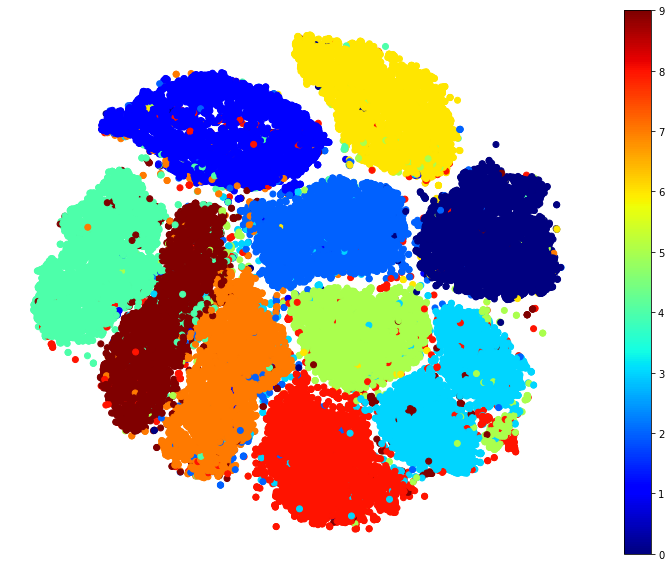

In [27]:
import matplotlib.pyplot as plt

plt.figure(figsize=(13,10))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=t, cmap='jet')
plt.colorbar()
plt.axis('off')



In [24]:
mnist['target']

array(['5', '0', '4', ..., '4', '5', '6'], dtype=object)